In [1]:
from functions import *

/glade/u/apps/opt/conda/envs/npl-2024b/lib/python3.11/site-packages/xarray/conventions.py:286: SerializationWarning: variable 'psl' has multiple fill values {1e+20, 1e+20} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)


In [2]:
laurentide_smb["data"].shape, laurentide_qice_melt["data"].shape

((2403, 1200), (2403, 1200))

PROCESSING SMB DATA AND CONVERTING TO 2D
______________
DOING PCA
covariance matrix shape (2403, 2403)
we calculated the first  10  evals
______________
PLOTTING EVALS


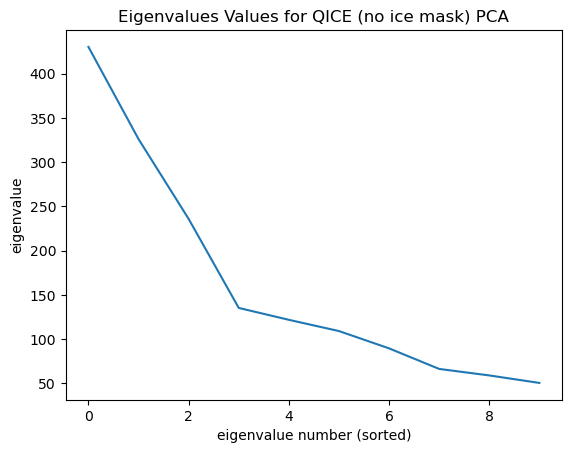

1 variance explained: 26.49%
2 variance explained: 20.07%
3 variance explained: 14.52%
4 variance explained: 8.33%
______________
PLOTTING TIME


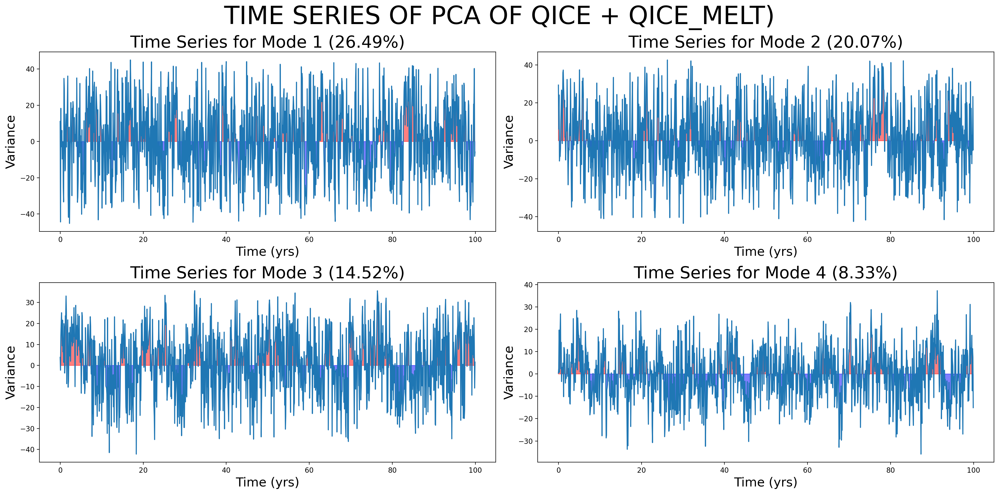

______________
PLOTTING PCs


IndexError: only integers, slices (`:`), ellipsis (`...`), numpy.newaxis (`None`) and integer or boolean arrays are valid indices

In [12]:
print("PROCESSING SMB DATA AND CONVERTING TO 2D")
smb_X_dimensional = xr.DataArray(np.array(laurentide_smb["data"], dtype=float) +  np.array(laurentide_qice_melt["data"], dtype=float))
smb_longs = xr.DataArray(np.array(laurentide_smb["long_pos"], dtype=float) +  np.array(laurentide_qice_melt["long_pos"], dtype=float))
smb_lats = xr.DataArray(np.array(laurentide_smb["lat_pos"], dtype=float) +  np.array(laurentide_qice_melt["lat_pos"], dtype=float)) 
smb_long_length = int(laurentide_smb["long_length"]) + int(laurentide_qice_melt["long_length"]) 
smb_lat_length = int(laurentide_smb["lat_length"]) + int(laurentide_qice_melt["lat_length"]) 
smb_processed = xr.DataArray(np.array(laurentide_smb["original"], dtype=float) +  np.array(laurentide_qice_melt["original"], dtype=float))
print("______________")
print("DOING PCA")
smb_eigenvalues, smb_V, smb_X = pca(smb_X_dimensional, 10)
print("______________")
print("PLOTTING EVALS")
perc_smb = plot_eigen(smb_eigenvalues, "QICE (no ice mask)")
print("______________")
print("PLOTTING TIME")
plot_time_series(smb_V, smb_X, 4, "TIME SERIES OF PCA OF QICE + QICE_MELT)", perc_smb)
print("______________")
print("PLOTTING PCs")
smb_PCAs = nans_2d_to_3d(smb_V, smb_long_length, smb_lat_length, smb_longs, smb_lats)
data_smb ={
    'reshaped_pca': smb_PCAs,
    'original': smb_processed,
    'label': "m/year (deseasonalized)",
    'shift': 360,
    'l_override': {
        0: .15,
        1: .18,
        2: .19,
        3: .11
    },
    'perc': perc_smb
}

plot_pcs(data_smb, 4, "PCA OF QICE (SMB) OF QICE + QICE_MELT)")

# PSL

## NAO (PCA of PSL in Ocean)

PROCESSING PSL DATA AND CONVERTING TO 2D
______________
DOING PCA
covariance matrix shape (6720, 6720)
we calculated the first  10  evals
______________
PLOTTING EVALS


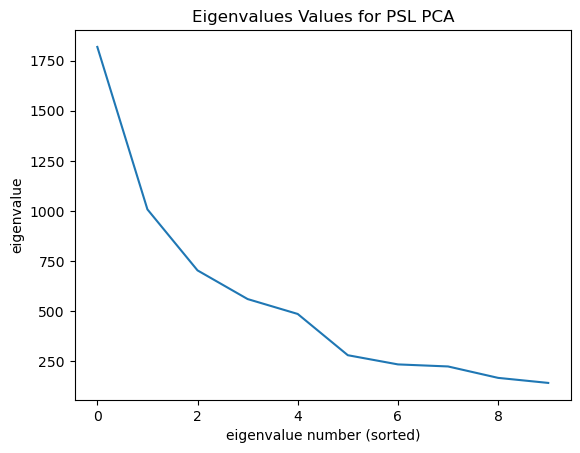

1 variance explained: 32.35%
2 variance explained: 17.93%
3 variance explained: 12.51%
4 variance explained: 9.96%
______________
PLOTTING TIME


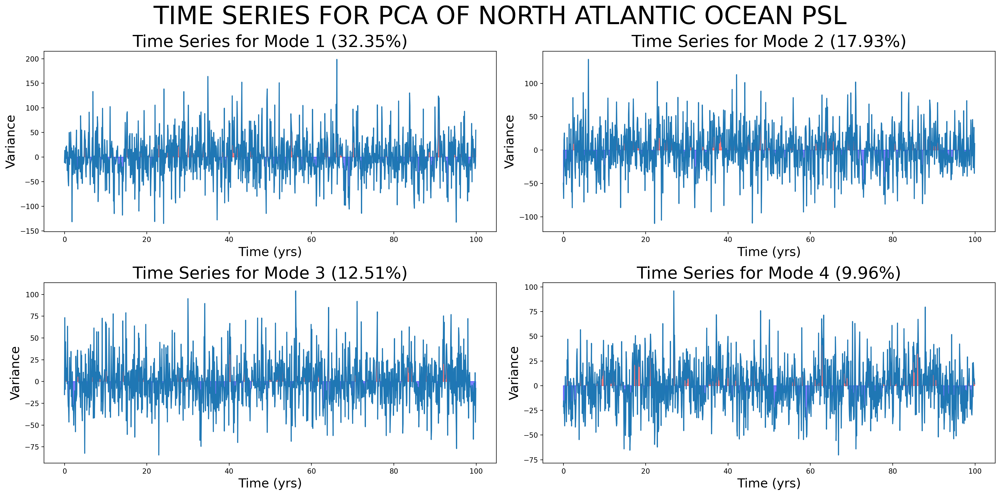

______________
PLOTTING PCs


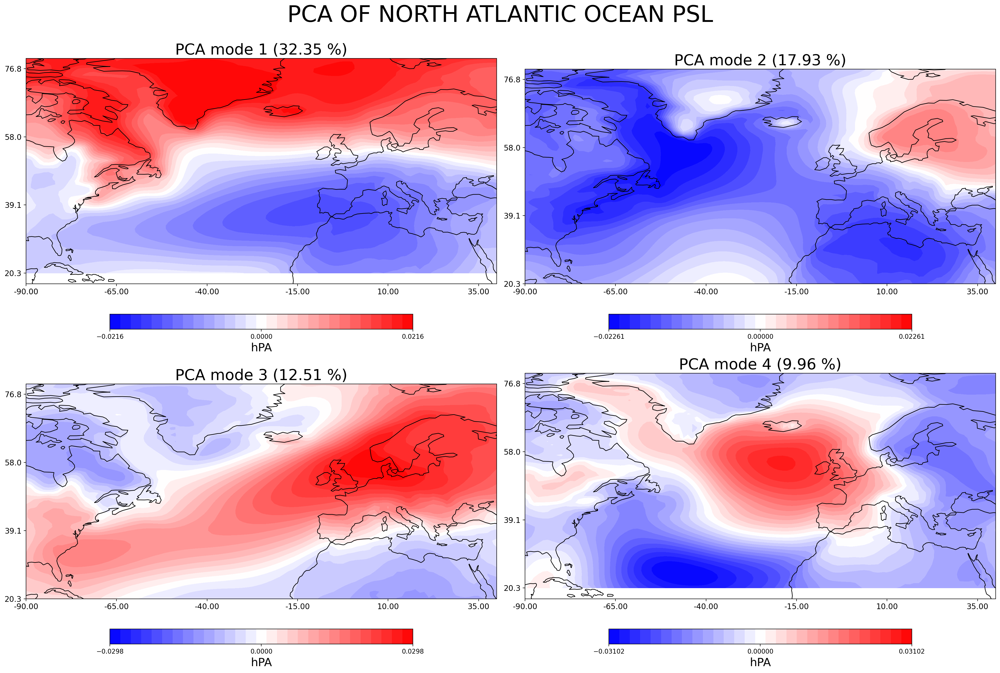

In [3]:
print("PROCESSING PSL DATA AND CONVERTING TO 2D")
X_dimensional = psl["data"]
lat_length = int(psl["lat_length"])
long_length = int(psl["long_length"])
north_atlantic_ocean_psl = psl["original"]
print("______________")
print("DOING PCA")
X = standardize(X_dimensional)
X = X.T
eigenvalues, V, X = pca(X, 10, False)
print("______________")
print("PLOTTING EVALS")
perc_psl = plot_eigen(eigenvalues, "PSL")
print("______________")
print("PLOTTING TIME")
plot_time_series(V, X, 4, "TIME SERIES FOR PCA OF NORTH ATLANTIC OCEAN PSL", perc_psl)
print("______________")
print("PLOTTING PCs")
PCs_reshaped = V.reshape(lat_length,long_length, 10)
data_psl ={
    'reshaped_pca': PCs_reshaped,
    'original': north_atlantic_ocean_psl,
    'label': "hPA",
    'shift': 0,
    'l_override': {},
    'perc': perc_psl
}

plot_pcs(data_psl, 4, "PCA OF NORTH ATLANTIC OCEAN PSL")

## QICE + QICE_MELT

In [ ]:
total = laurentide_smb + laurentide_qice_melt
print("PROCESSING SMB DATA AND CONVERTING TO 2D")
smb_X_dimensional = total["data"]
smb_longs = total["long_pos"]
smb_lats = total["lat_pos"]
smb_long_length = int(total["long_length"])
smb_lat_length = int(total["lat_length"])
smb_processed = total["original"]
print("______________")
print("DOING PCA")
smb_eigenvalues, smb_V, smb_X = pca(smb_X_dimensional, 10)
print("______________")
print("PLOTTING EVALS")
perc_smb = plot_eigen(smb_eigenvalues, "QICE (no ice mask)")
print("______________")
print("PLOTTING TIME")
plot_time_series(smb_V, smb_X, 4, "TIME SERIES OF PCA OF QICE + QICE_MELT)", perc_smb)
print("______________")
print("PLOTTING PCs")
smb_PCAs = nans_2d_to_3d(smb_V, smb_long_length, smb_lat_length, smb_longs, smb_lats)
data_smb ={
    'reshaped_pca': smb_PCAs,
    'original': smb_processed,
    'label': "m/year (deseasonalized)",
    'shift': 360,
    'l_override': {
        0: .15,
        1: .18,
        2: .19,
        3: .11
    },
    'perc': perc_smb
}

plot_pcs(data_smb, 4, "PCA OF QICE (SMB) OF QICE + QICE_MELT)")

# SMB

## SMB over Laurentide no Ice Mask

PROCESSING SMB DATA AND CONVERTING TO 2D
______________
DOING PCA
covariance matrix shape (2691, 2691)
we calculated the first  10  evals
______________
PLOTTING EVALS


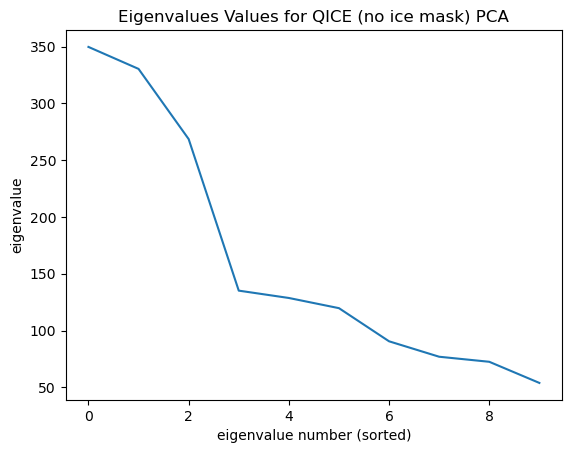

1 variance explained: 21.51%
2 variance explained: 20.32%
3 variance explained: 16.52%
4 variance explained: 8.31%
______________
PLOTTING TIME


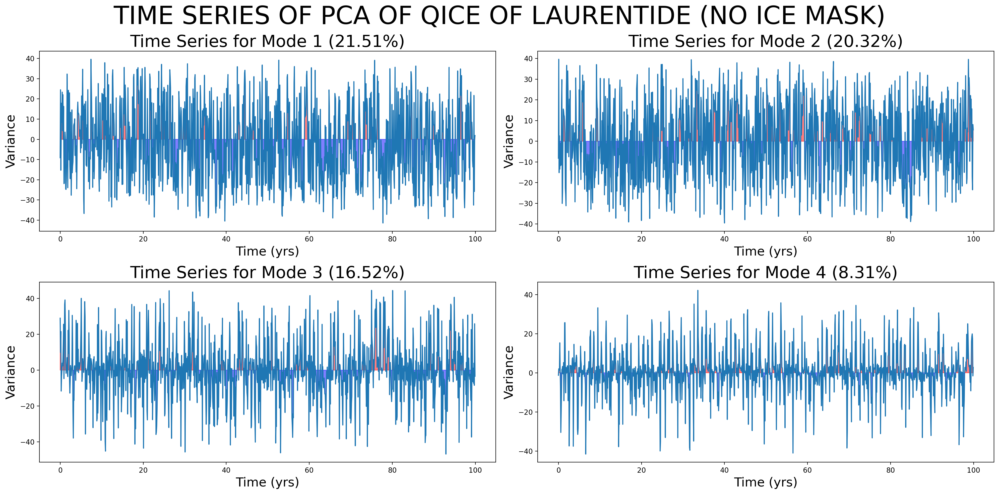

______________
PLOTTING PCs


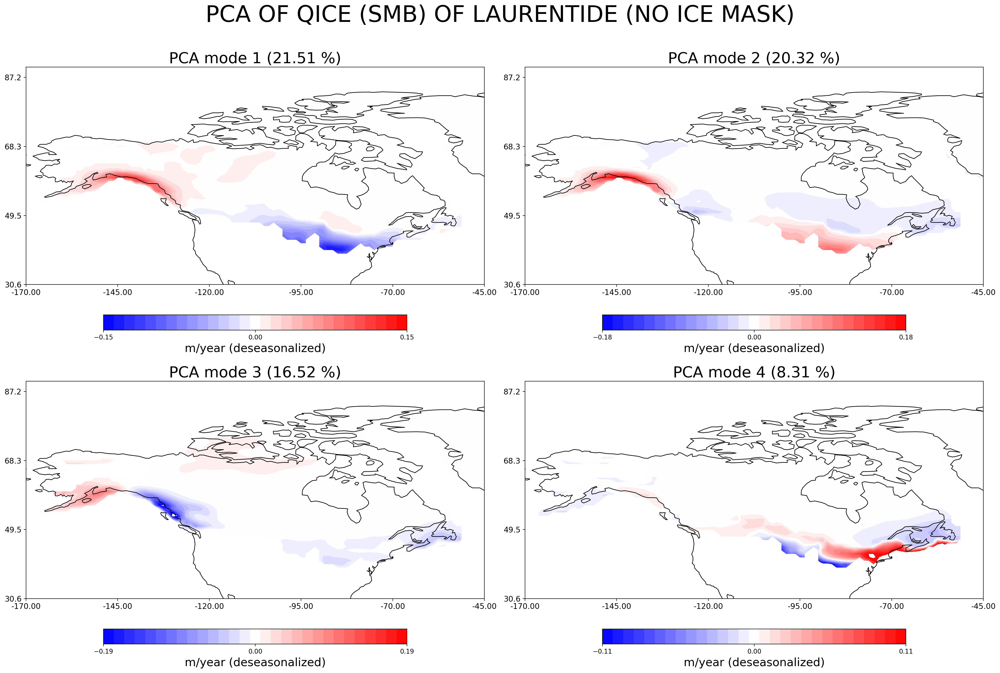

In [4]:
print("PROCESSING SMB DATA AND CONVERTING TO 2D")
smb_X_dimensional = laurentide_smb["data"]
smb_longs = laurentide_smb["long_pos"]
smb_lats = laurentide_smb["lat_pos"]
smb_long_length = int(laurentide_smb["long_length"])
smb_lat_length = int(laurentide_smb["lat_length"])
smb_processed = laurentide_smb["original"]
print("______________")
print("DOING PCA")
smb_eigenvalues, smb_V, smb_X = pca(smb_X_dimensional, 10)
print("______________")
print("PLOTTING EVALS")
perc_smb = plot_eigen(smb_eigenvalues, "QICE (no ice mask)")
print("______________")
print("PLOTTING TIME")
plot_time_series(smb_V, smb_X, 4, "TIME SERIES OF PCA OF QICE OF LAURENTIDE (NO ICE MASK)", perc_smb)
print("______________")
print("PLOTTING PCs")
smb_PCAs = nans_2d_to_3d(smb_V, smb_long_length, smb_lat_length, smb_longs, smb_lats)
data_smb ={
    'reshaped_pca': smb_PCAs,
    'original': smb_processed,
    'label': "m/year (deseasonalized)",
    'shift': 360,
    'l_override': {
        0: .15,
        1: .18,
        2: .19,
        3: .11
    },
    'perc': perc_smb
}

plot_pcs(data_smb, 4, "PCA OF QICE (SMB) OF LAURENTIDE (NO ICE MASK)")

## SMB for Laurentide with 100% Ice only

PROCESSING SMB DATA AND CONVERTING TO 2D
______________
DOING PCA
covariance matrix shape (2110, 2110)
we calculated the first  10  evals
______________
PLOTTING EVALS


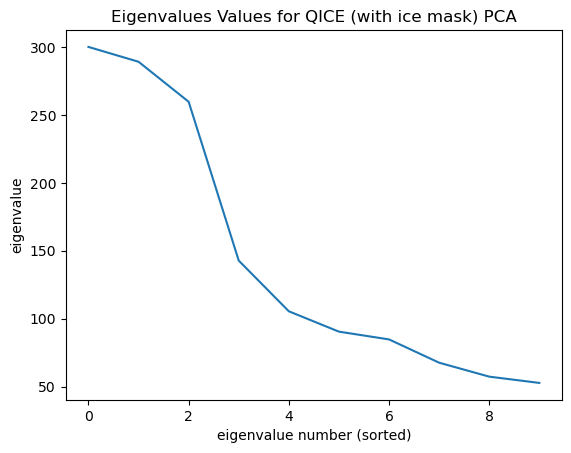

1 variance explained: 20.69%
2 variance explained: 19.94%
3 variance explained: 17.91%
4 variance explained: 9.85%
______________
PLOTTING TIME


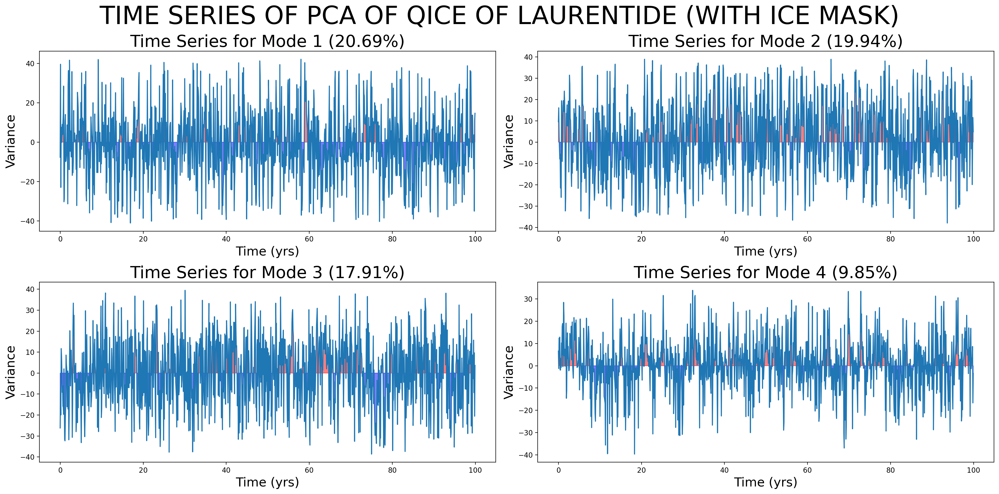

______________
PLOTTING PCs


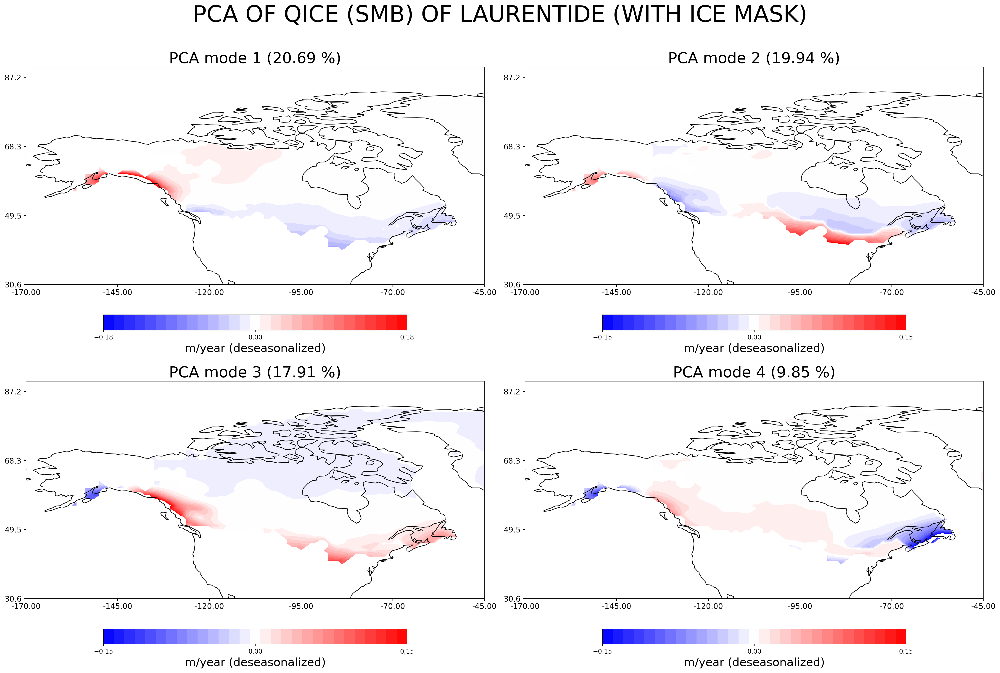

In [5]:
print("PROCESSING SMB DATA AND CONVERTING TO 2D")
smb100_X_dimensional = laurentide_smb_mask["data"]
smb100_longs = laurentide_smb_mask["long_pos"]
smb100_lats = laurentide_smb_mask["lat_pos"]
smb100_long_length = int(laurentide_smb_mask["long_length"])
smb100_lat_length = int(laurentide_smb_mask["lat_length"])
smb_100_ice = laurentide_smb_mask["original"]
print("______________")
print("DOING PCA")
smb100_eigenvalues, smb100_V, smb100_X = pca(smb100_X_dimensional, 10)
print("______________")
print("PLOTTING EVALS")
perc_smb_100 = plot_eigen(smb100_eigenvalues, "QICE (with ice mask)")
print("______________")
print("PLOTTING TIME")
plot_time_series(smb100_V, smb100_X, 4, "TIME SERIES OF PCA OF QICE OF LAURENTIDE (WITH ICE MASK)", perc_smb_100)
print("______________")
print("PLOTTING PCs")
smb100_PCAs = nans_2d_to_3d(smb100_V, smb100_long_length, smb100_lat_length, smb100_longs, smb100_lats)
data_smb_100 ={
    'reshaped_pca': smb100_PCAs,
    'original': smb_100_ice,
    'label': "m/year (deseasonalized)",
    'shift': 360,
    'l_override': {
        0: .18,
        1: .15,
        2: .15,
        3: .15
    },
    'perc': perc_smb_100
}

plot_pcs(data_smb_100, 4, "PCA OF QICE (SMB) OF LAURENTIDE (WITH ICE MASK)")

## QICE_MELT

### NO ICE MASK

PROCESSING QICE DATA AND CONVERTING TO 2D
______________
DOING PCA
covariance matrix shape (2691, 2691)
we calculated the first  10  evals
______________
PLOTTING EVALS


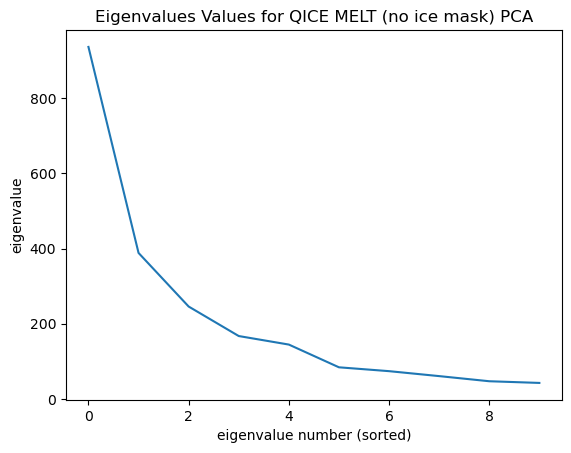

1 variance explained: 42.74%
2 variance explained: 17.73%
3 variance explained: 11.22%
4 variance explained: 7.64%
______________
PLOTTING TIME


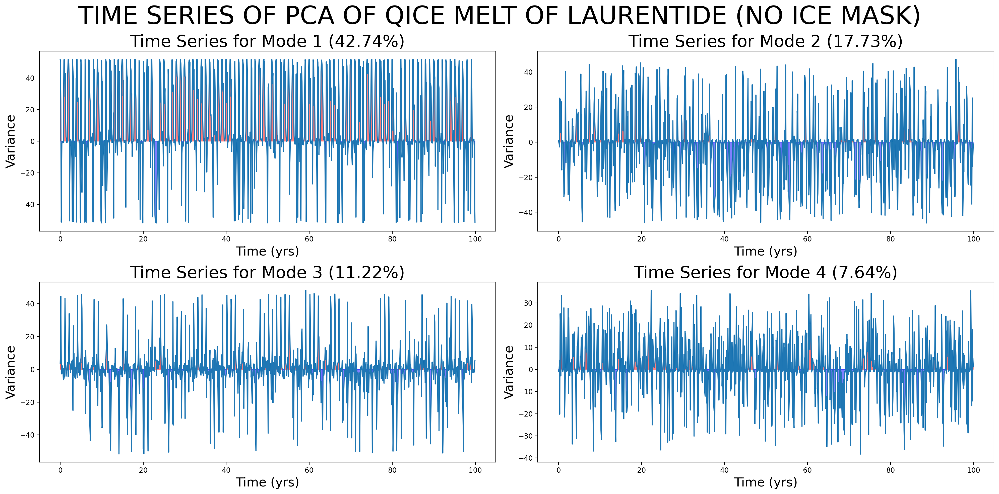

______________
PLOTTING PCs


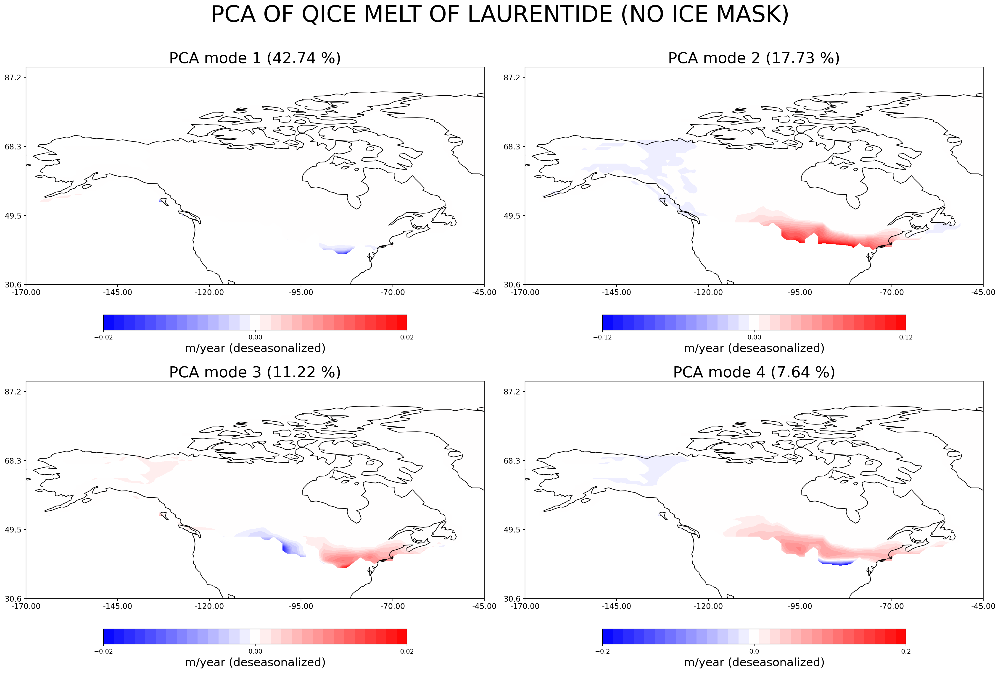

In [6]:
print("PROCESSING QICE DATA AND CONVERTING TO 2D")
qice_melt_X_dimensional = laurentide_qice_melt["data"]
qice_melt_longs = laurentide_qice_melt["long_pos"]
qice_melt_lats = laurentide_qice_melt["lat_pos"]
qice_melt_long_length = int(laurentide_qice_melt["long_length"])
qice_melt_lat_length = int(laurentide_qice_melt["lat_length"])
qice_melt_processed = laurentide_qice_melt["original"]
print("______________")
print("DOING PCA")
qice_melt_eigenvalues, qice_melt_V, qice_melt_X = pca(qice_melt_X_dimensional, 10)
print("______________")
print("PLOTTING EVALS")
perc_qice_melt = plot_eigen(qice_melt_eigenvalues, "QICE MELT (no ice mask)")
print("______________")
print("PLOTTING TIME")
plot_time_series(qice_melt_V, qice_melt_X, 4, "TIME SERIES OF PCA OF QICE MELT OF LAURENTIDE (NO ICE MASK)", perc_qice_melt)
print("______________")
print("PLOTTING PCs")
qice_melt_PCAs = nans_2d_to_3d(qice_melt_V, qice_melt_long_length, qice_melt_lat_length, qice_melt_longs, qice_melt_lats)
data_melt ={
    'reshaped_pca': qice_melt_PCAs,
    'original': qice_melt_processed,
    'label': "m/year (deseasonalized)",
    'shift': 360,
    'l_override': {
        0: .02,
        1: .12,
        2: .02,
        3: .2
    },
    'perc': perc_qice_melt
}

plot_pcs(data_melt, 4, "PCA OF QICE MELT OF LAURENTIDE (NO ICE MASK)")

### WITH ICE MASK

PROCESSING QICE DATA AND CONVERTING TO 2D
______________
DOING PCA
covariance matrix shape (2110, 2110)
we calculated the first  10  evals
______________
PLOTTING EVALS


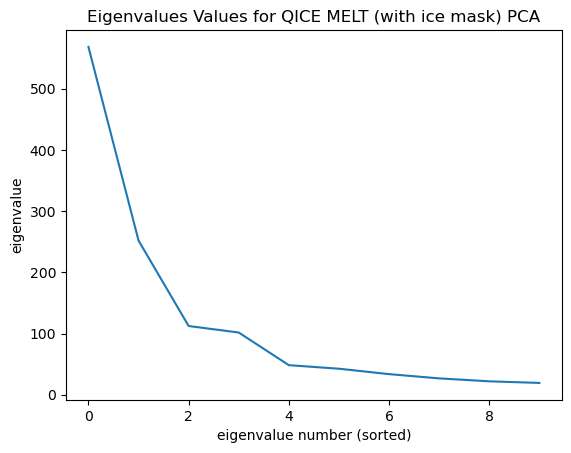

1 variance explained: 46.33%
2 variance explained: 20.53%
3 variance explained: 9.16%
4 variance explained: 8.29%
______________
PLOTTING TIME


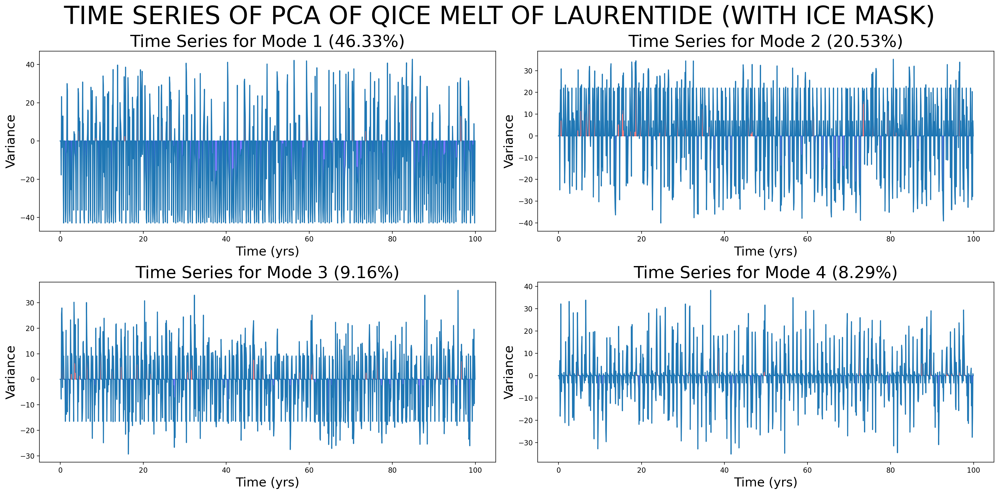

______________
PLOTTING PCs


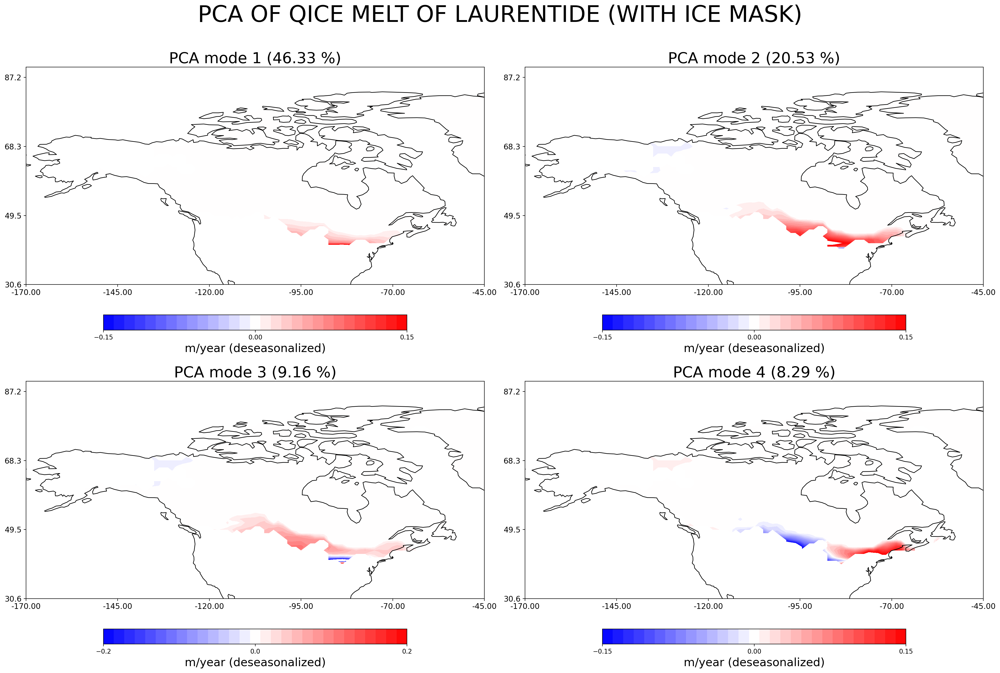

In [8]:
print("PROCESSING QICE DATA AND CONVERTING TO 2D")
qice_melt_100_X_dimensional = laurentide_qice_melt_mask["data"]
qice_melt_100_longs = laurentide_qice_melt_mask["long_pos"]
qice_melt_100_lats = laurentide_qice_melt_mask["lat_pos"]
qice_melt_100_long_length = int(laurentide_qice_melt_mask["long_length"])
qice_melt_100_lat_length = int(laurentide_qice_melt_mask["lat_length"])
qice_melt_100_processed = laurentide_qice_melt_mask["original"]
print("______________")
print("DOING PCA")
qice_melt_100_eigenvalues, qice_melt_100_V, qice_melt_100_X = pca(qice_melt_100_X_dimensional, 10)
print("______________")
print("PLOTTING EVALS")
perc_qice_melt_100 = plot_eigen(qice_melt_100_eigenvalues, "QICE MELT (with ice mask)")
print("______________")
print("PLOTTING TIME")
plot_time_series(qice_melt_100_V, qice_melt_100_X, 4, "TIME SERIES OF PCA OF QICE MELT OF LAURENTIDE (WITH ICE MASK)", perc_qice_melt_100)
print("______________")
print("PLOTTING PCs")
qice_melt_100_PCAs = nans_2d_to_3d(qice_melt_100_V, qice_melt_100_long_length, qice_melt_100_lat_length, qice_melt_100_longs, qice_melt_100_lats)

data_melt_100 ={
    'reshaped_pca': qice_melt_100_PCAs,
    'original': qice_melt_100_processed,
    'label': "m/year (deseasonalized)",
    'shift': 360,
    'l_override': {
        0: .15,
        1: .15,
        2: .2,
        3: .15
        
    },
    'perc': perc_qice_melt_100
}

plot_pcs(data_melt_100, 4, "PCA OF QICE MELT OF LAURENTIDE (WITH ICE MASK)")
